<a href="https://colab.research.google.com/github/Nikole370/Recomendacion-de-productos-skincare/blob/main/EDA_Sephora_Products.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  **Trabajo Parcial – Data Mining Tools 1ACC0209-2520-14089**
---
## **Analisis EDA**  
**Semestre:** 2025-2  
**Docente:** Ph. D. Carlos Fernando Montoya Cubas  
**Universidad Peruana de Ciencias Aplicadas**   

Dataset: [Sephora Products and Skincare Reviews](https://www.kaggle.com/datasets/nadyinky/sephora-products-and-skincare-reviews?select=product_info.csv)

---
  
### **Grupo | Integrantes**
| Nombre del Alumno                    |    Código      |
|--------------------------------------|----------------|
| Andrea Fabiana Garcia Napuri         | u202014068     |
| Nikole Scarlet Garcia Chavez         | u20181b618     |
| Fernando Samuel Paredes Ezpinoza     | u202122837     |

## **Instalación de dependencias**

In [ ]:
!pip install kagglehub[pandas-datasets]
!pip install ydata-profiling
!pip install squarify

## **Importación de bibliotecas**

In [ ]:
import kagglehub
from kagglehub import KaggleDatasetAdapter
import pandas as pd
from ydata_profiling import ProfileReport
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import squarify
from collections import Counter
import re
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.dates as mdates

import warnings


warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
sns.set_palette("viridis")

## **1. Carga de Dataset**

In [ ]:
#Archivos a descargar de Kaggle
csv_files = [
    "product_info.csv",
    "reviews_0-250.csv",
    "reviews_250-500.csv",
    "reviews_500-750.csv",
    "reviews_750-1250.csv",
    "reviews_1250-end.csv"
]
dataframes = {}

for file in csv_files:
    print(f"Cargando {file}...")
    df_name = file.replace('.csv', '')
    dataframes[df_name] = kagglehub.load_dataset(
        KaggleDatasetAdapter.PANDAS,
        "nadyinky/sephora-products-and-skincare-reviews",
        file,
        pandas_kwargs={'on_bad_lines': 'skip'}
    )

review_df_names = [name for name in dataframes.keys() if name.startswith('reviews')]
reviews_df = pd.concat([dataframes[name] for name in review_df_names], ignore_index=True)
products_df = dataframes['product_info']
print(f"\nSe han unificado todas las reseñas en un solo DataFrame llamado 'reviews_df' con {reviews_df.shape[0]} filas.")

Cargando product_info.csv...
Using Colab cache for faster access to the 'sephora-products-and-skincare-reviews' dataset.
Cargando reviews_0-250.csv...
Using Colab cache for faster access to the 'sephora-products-and-skincare-reviews' dataset.
Cargando reviews_250-500.csv...
Using Colab cache for faster access to the 'sephora-products-and-skincare-reviews' dataset.
Cargando reviews_500-750.csv...
Using Colab cache for faster access to the 'sephora-products-and-skincare-reviews' dataset.
Cargando reviews_750-1250.csv...
Using Colab cache for faster access to the 'sephora-products-and-skincare-reviews' dataset.
Cargando reviews_1250-end.csv...
Using Colab cache for faster access to the 'sephora-products-and-skincare-reviews' dataset.

Se han unificado todas las reseñas en un solo DataFrame llamado 'reviews_df' con 1094411 filas.


## **2. Limpieza y Preprocesamiento de Datos**

### **Products Info**

In [ ]:
print("\n[INFO] Información General:")
products_df.info()


[INFO] Información General:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8494 entries, 0 to 8493
Data columns (total 27 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   product_id          8494 non-null   object 
 1   product_name        8494 non-null   object 
 2   brand_id            8494 non-null   int64  
 3   brand_name          8494 non-null   object 
 4   loves_count         8494 non-null   int64  
 5   rating              8216 non-null   float64
 6   reviews             8216 non-null   float64
 7   size                6863 non-null   object 
 8   variation_type      7050 non-null   object 
 9   variation_value     6896 non-null   object 
 10  variation_desc      1250 non-null   object 
 11  ingredients         7549 non-null   object 
 12  price_usd           8494 non-null   float64
 13  value_price_usd     451 non-null    float64
 14  sale_price_usd      270 non-null    float64
 15  limited_edition     8494 n

In [ ]:
# Resumen estadístico de las columnas numéricas.
print("\nResumen Estadístico:")
display(products_df[['loves_count', 'rating', 'reviews', 'price_usd']].describe().T)

# Limpieza básica: Verificar duplicados por product_id.
print(f"\nProductos duplicados (por product_id): {products_df['product_id'].duplicated().sum()}")


Resumen Estadístico:


,count,mean,std,min,25%,50%,75%,max
loves_count,8494.0,29179.565929,66092.122590,0.0,3758.000000,9880.00000,26841.250000,1401068.0
rating,8216.0,4.194513,0.516694,1.0,3.981725,4.28935,4.530525,5.0
reviews,8216.0,448.545521,1101.982529,1.0,26.000000,122.00000,418.000000,21281.0
price_usd,8494.0,51.655595,53.669234,3.0,25.000000,35.00000,58.000000,1900.0



Productos duplicados (por product_id): 0


In [ ]:
#Conteo de nulos
null_counts = products_df.isnull().sum()
null_percentages = (products_df.isnull().sum() / len(products_df) * 100)

null_summary = pd.DataFrame({
    'Nulos_Conteo': null_counts,
    'Nulos_Porcentaje': null_percentages
})
print("\nResumen de Valores Nulos por Columna (products_df):")
display(null_summary[null_summary['Nulos_Conteo'] > 0].sort_values(by='Nulos_Porcentaje', ascending=False))


Resumen de Valores Nulos por Columna (products_df):


,Nulos_Conteo,Nulos_Porcentaje
sale_price_usd,8224,96.821286
value_price_usd,8043,94.690370
variation_desc,7244,85.283730
child_max_price,5740,67.577113
child_min_price,5740,67.577113
highlights,2207,25.983047
size,1631,19.201789
variation_value,1598,18.813280
variation_type,1444,17.000235
tertiary_category,990,11.655286


In [ ]:
#Tratamiento de nulos
products_df_cleaned = products_df.copy()

#ELIMINAR COLUMNAS(nulos altos)
cols_to_drop = [
    'sale_price_usd',
    'value_price_usd',
    'variation_desc',
    'child_max_price',
    'child_min_price'
]
products_df_cleaned = products_df_cleaned.drop(columns=cols_to_drop)
print(f"Se eliminaron las columnas: {cols_to_drop}")

#INPUTACION (nulos moderados)
impute_map = {
    'highlights': 'No Highlights',
    'size': 'Unknown',
    'variation_value': 'Unknown',
    'variation_type': 'Not Applicable',
    'tertiary_category': 'No Sub-category'
}
for col, value in impute_map.items():
    products_df_cleaned[col].fillna(value, inplace=True)
print(f"Se imputaron valores en las columnas: {list(impute_map.keys())}")


# ELIMINAR FILAS (nulos bajos)
critical_cols = [
    'ingredients',
    'rating',
    'reviews',
    'secondary_category'
]
initial_rows = len(products_df_cleaned)
products_df_cleaned.dropna(subset=critical_cols, inplace=True)
final_rows = len(products_df_cleaned)
print(f"Se eliminaron {initial_rows - final_rows} filas con valores nulos en columnas críticas.")

Se eliminaron las columnas: ['sale_price_usd', 'value_price_usd', 'variation_desc', 'child_max_price', 'child_min_price']
Se imputaron valores en las columnas: ['highlights', 'size', 'variation_value', 'variation_type', 'tertiary_category']
Se eliminaron 1175 filas con valores nulos en columnas críticas.


### **Reviews Info**

In [ ]:
print("\nInformación General:")
reviews_df.info(show_counts=True)


Información General:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1094411 entries, 0 to 1094410
Data columns (total 19 columns):
 #   Column                    Non-Null Count    Dtype  
---  ------                    --------------    -----  
 0   Unnamed: 0                1094411 non-null  int64  
 1   author_id                 1094411 non-null  object 
 2   rating                    1094411 non-null  int64  
 3   is_recommended            926423 non-null   float64
 4   helpfulness               532819 non-null   float64
 5   total_feedback_count      1094411 non-null  int64  
 6   total_neg_feedback_count  1094411 non-null  int64  
 7   total_pos_feedback_count  1094411 non-null  int64  
 8   submission_time           1094411 non-null  object 
 9   review_text               1092967 non-null  object 
 10  review_title              783757 non-null   object 
 11  skin_tone                 923872 non-null   object 
 12  eye_color                 884783 non-null   object 
 13  skin_

In [ ]:
# Resumen estadístico de las columnas numéricas.
print("\nResumen Estadístico:")
display(reviews_df[['rating', 'helpfulness', 'total_feedback_count']].describe().T)

# Limpieza básica: Verificar duplicados por autor y producto.
duplicate_reviews = reviews_df.duplicated(subset=['author_id', 'product_id']).sum()
print(f"\nReseñas duplicadas (mismo autor y producto): {duplicate_reviews}")


Resumen Estadístico:


,count,mean,std,min,25%,50%,75%,max
rating,1094411.0,4.299158,1.149444,1.0,4.000000,5.000000,5.0,5.0
helpfulness,532819.0,0.767782,0.317164,0.0,0.652174,0.928571,1.0,1.0
total_feedback_count,1094411.0,4.177126,22.715238,0.0,0.000000,0.000000,3.0,5464.0



Reseñas duplicadas (mismo autor y producto): 5520


In [ ]:
null_counts_reviews = reviews_df.isnull().sum()
null_percentages_reviews = (reviews_df.isnull().sum() / len(reviews_df) * 100)

null_summary_reviews = pd.DataFrame({
    'Nulos_Conteo': null_counts_reviews,
    'Nulos_Porcentaje': null_percentages_reviews
})

print("\nResumen de Valores Nulos por Columna (reviews_df):")
display(null_summary_reviews[null_summary_reviews['Nulos_Conteo'] > 0].sort_values(by='Nulos_Porcentaje', ascending=False))


Resumen de Valores Nulos por Columna (reviews_df):


,Nulos_Conteo,Nulos_Porcentaje
helpfulness,561592,51.314543
review_title,310654,28.385497
hair_color,226768,20.720552
eye_color,209628,19.154413
skin_tone,170539,15.582720
is_recommended,167988,15.349626
skin_type,111557,10.193337
review_text,1444,0.131943


In [ ]:
reviews_df_cleaned = reviews_df.copy()

# Tratamiento de Duplicados
initial_rows = len(reviews_df_cleaned)

reviews_df_cleaned.drop_duplicates(subset=['author_id', 'product_id'], keep='first', inplace=True)
final_rows = len(reviews_df_cleaned)
print(f"Se eliminaron {initial_rows - final_rows} reseñas duplicadas.")

# Tratamiento de Valores Nulos

#NO SE ELIMINAN COLUMNAS PARA NO PERDER CARACTERISTICAS IMPORTANTES

#INPUTACION (nulos moderados)
impute_map_reviews = {
    'helpfulness': 0,
    'review_title': 'No Title',
    'hair_color': 'Not Specified',
    'eye_color': 'Not Specified',
    'skin_tone': 'Not Specified'
}

for col, value in impute_map_reviews.items():
    reviews_df_cleaned[col] = reviews_df_cleaned[col].fillna(value)
print(f"\nSe imputaron valores en las columnas: {list(impute_map_reviews.keys())}")

# ELIMINAR FILAS (nulos bajos)
critical_cols_reviews = [
    'review_text',
    'skin_type',
    'is_recommended'
]

initial_rows_reviews = len(reviews_df_cleaned)
reviews_df_cleaned.dropna(subset=critical_cols_reviews, inplace=True)
final_rows_reviews = len(reviews_df_cleaned)
print(f"Se eliminaron {initial_rows_reviews - final_rows_reviews} filas con valores nulos en columnas críticas.")


Se eliminaron 5520 reseñas duplicadas.

Se imputaron valores en las columnas: ['helpfulness', 'review_title', 'hair_color', 'eye_color', 'skin_tone']
Se eliminaron 184914 filas con valores nulos en columnas críticas.


## **3. Analisis Visual (EDA)**

### **Products Info**

In [ ]:
#Análisis Automatizado con ydata-profiling

profile_products = ProfileReport(
    products_df_cleaned,
    title="Perfilamiento del Catálogo de Productos"
)
display(profile_products)


profile_products.to_file("reporte_productos.html")
print("Reporte de perfilamiento de productos guardado en 'reporte_productos.html'")


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 22/22 [00:02<00:00, 10.22it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Reporte de perfilamiento de productos guardado en 'reporte_productos.html'


#### **Analisis Reporte ydata**
Mediante el reporte de perfilamiento, se obtuvieron las siguientes conclusiones iniciales sobre el catálogo de productos:

* Se evidencia una fuerte asimetría en variables de negocio cruciales como
price_usd y loves_count. Esto confirma que el mercado se concentra en productos de gama media, mientras que la popularidad masiva (loves_count) es un fenómeno reservado para un número muy selecto de artículos.

* Con el dashboard se confirma la alta cardinalidad de la variable brand_name, lo que indica una amplia y competitiva diversidad de marcas. Esto nos orientó a enfocar los análisis manuales posteriores en las marcas más relevantes del catálogo.

* Se revela un notorio sesgo en la variable rating, donde la gran mayoría de productos concentra calificaciones entre 4.0 y 5.0. Este hallazgo sugiere que, para una recomendación efectiva, el rating debe ser combinado con otras métricas de popularidad y afinidad.

In [ ]:
#Análisis de Relación entre Variables

# --- 1. Categórica × Categórica: Marca × Categoría Principal ---
top_5_brands = products_df_cleaned['brand_name'].value_counts().nlargest(5).index
top_5_categories = products_df_cleaned['primary_category'].value_counts().nlargest(5).index
df_filtered_products = products_df_cleaned[
    products_df_cleaned['brand_name'].isin(top_5_brands) &
    products_df_cleaned['primary_category'].isin(top_5_categories)
]
ct_brand_category = pd.crosstab(df_filtered_products['brand_name'], df_filtered_products['primary_category'], normalize="index")
print("1. Categórica × Categórica: Proporción de Productos por Categoría para cada Marca Top (%)")
display((ct_brand_category * 100).round(2))


# --- 2. Categórica × Numérica: Categoría Principal × Precio ---
category_price_stats = products_df_cleaned[products_df_cleaned['primary_category'].isin(top_5_categories)].groupby("primary_category")["price_usd"].agg(['mean', 'std', 'count'])
print("\n2. Categórica × Numérica: Estadísticas de Precio para las Categorías Top")
display(category_price_stats.sort_values(by="mean", ascending=False).round(2))


# --- 3. Numérica × Numérica: "Loves Count" × Rating del Producto ---
loves_rating_corr = products_df_cleaned[['loves_count', 'rating']].corr()
print("\n3. Numérica × Numérica: Correlación entre Popularidad (Loves) y Calificación")
loves_rating_corr.round(2)

1. Categórica × Categórica: Proporción de Productos por Categoría para cada Marca Top (%)


primary_category,Bath & Body,Fragrance,Hair,Makeup,Skincare
brand_name,,,,,
CLINIQUE,1.97,2.63,0.00,38.82,56.58
Dior,9.17,28.33,0.00,40.00,22.50
Kérastase,0.00,0.00,100.00,0.00,0.00
SEPHORA COLLECTION,6.53,0.50,6.53,52.76,33.67
tarte,0.92,0.00,0.00,77.98,21.10



2. Categórica × Numérica: Estadísticas de Precio para las Categorías Top


,mean,std,count
primary_category,,,
Fragrance,91.24,65.13,1185
Skincare,58.40,56.24,2224
Bath & Body,40.85,28.07,364
Hair,35.18,16.89,1232
Makeup,33.23,17.81,1999



3. Numérica × Numérica: Correlación entre Popularidad (Loves) y Calificación


,loves_count,rating
loves_count,1.00,0.04
rating,0.04,1.00


#### **Análisis de Relación entre Variables**

Interpretación de los Resultados
1. **`Proporción de Productos por Categoría para cada Marca`**
Este análisis revela las diferentes estrategias de mercado de las marcas más importantes. Se observa una clara especialización en marcas como Kérastase, que dedica el cien por ciento de su catálogo a la categoría Hair. De forma similar, tarte se enfoca abrumadoramente en Makeup. En contraste, marcas como SEPHORA COLLECTION actúan como generalistas, manteniendo una presencia diversificada en casi todas las categorías, lo que demuestra su objetivo de cubrir un espectro de mercado mucho más amplio.

2. **`Estadísticas de Precio para las Categorías Top`**
La tabla muestra una clara jerarquía de precios entre las diferentes categorías de productos. La categoría Fragrance se posiciona como la más costosa en promedio, con un precio medio notablemente superior al resto. Le sigue Skincare, que también presenta un punto de precio elevado. Las categorías de Makeup y Hair son, en comparación, más accesibles para el consumidor promedio, estableciendo así distintos niveles de valor y lujo en el mercado.

3. **`Correlación entre Popularidad y Calificación`**
El análisis de correlación buscaba determinar si la popularidad de un producto, medida por su loves_count, está relacionada con su calidad, representada por su rating. El resultado de 0.04 es un valor muy cercano a cero, lo que indica que no existe una relación lineal significativa entre estas dos variables. Este hallazgo es muy importante, ya que demuestra que la popularidad de un producto no depende de su calificación, sugiriendo que otros factores como el marketing o la reputación de la marca son más influyentes.

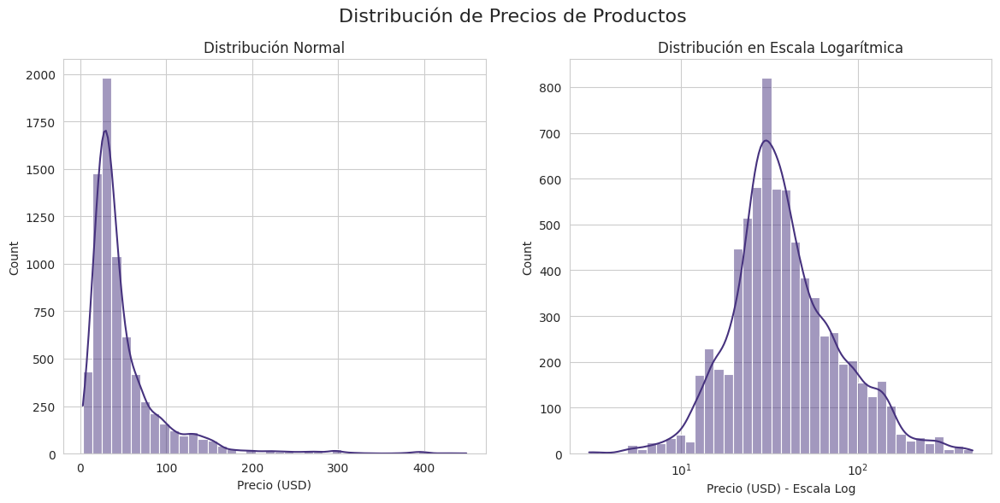

In [ ]:
#1 Distribución de Precios en Escala Logarítmica
plt.figure(figsize=(14, 6))
plt.suptitle("Distribución de Precios de Productos", fontsize=16)

plt.subplot(1, 2, 1)
sns.histplot(products_df_cleaned['price_usd'], bins=40, kde=True)
plt.title('Distribución Normal')
plt.xlabel('Precio (USD)')

plt.subplot(1, 2, 2)
sns.histplot(products_df_cleaned['price_usd'], bins=40, kde=True, log_scale=True)
plt.title('Distribución en Escala Logarítmica')
plt.xlabel('Precio (USD) - Escala Log')

plt.show()

#### **Analisis Grafica 1: Distribución de Precios de Productos**

La gráfica de la distribución de precios evidencia una fuerte asimetría, con una abrumadora concentración de productos en la gama baja a media. La transformación a una escala logarítmica confirma este patrón, revelando que el punto de mayor densidad se ubica entre los 20 y 70 dólares. Este hallazgo es clave para entender el posicionamiento de mercado de la mayoría de los artículos y la exclusividad de los productos de alto valor.

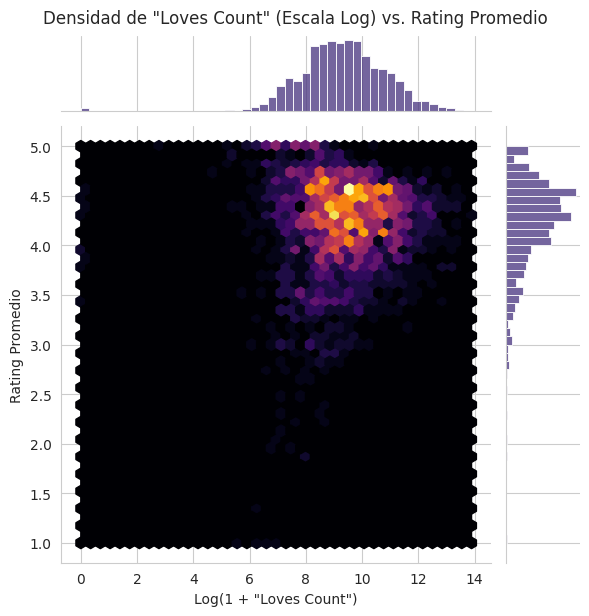

In [ ]:
#2 Relación entre Popularidad ("Loves Count") y Rating Promedio

data_sample = products_df_cleaned.sample(2000, random_state=42).copy()


data_sample['log_loves_count'] = np.log1p(data_sample['loves_count'])


plot = sns.jointplot(
    data=data_sample,
    x='log_loves_count',
    y='rating',
    kind='hex',
    cmap='inferno',
    gridsize=40
)

plot.fig.suptitle('Densidad de "Loves Count" (Escala Log) vs. Rating Promedio', y=1.02)
plot.ax_joint.set_xlabel('Log(1 + "Loves Count")')
plot.ax_joint.set_ylabel('Rating Promedio')

plt.show()

#### **Analisis Grafica 2: Relación entre Popularidad ("Loves Count") y Rating**

La relación entre la popularidad de un producto y su calificación promedio muestra una visión clara del mercado. Se observa una alta densidad de artículos con excelentes ratings, entre 4.0 y 4.5, pero con un número de "loves" relativamente bajo. Esto indica que aunque muchos productos son percibidos como de alta calidad, solo un pequeño grupo logra alcanzar un estatus de popularidad masiva.

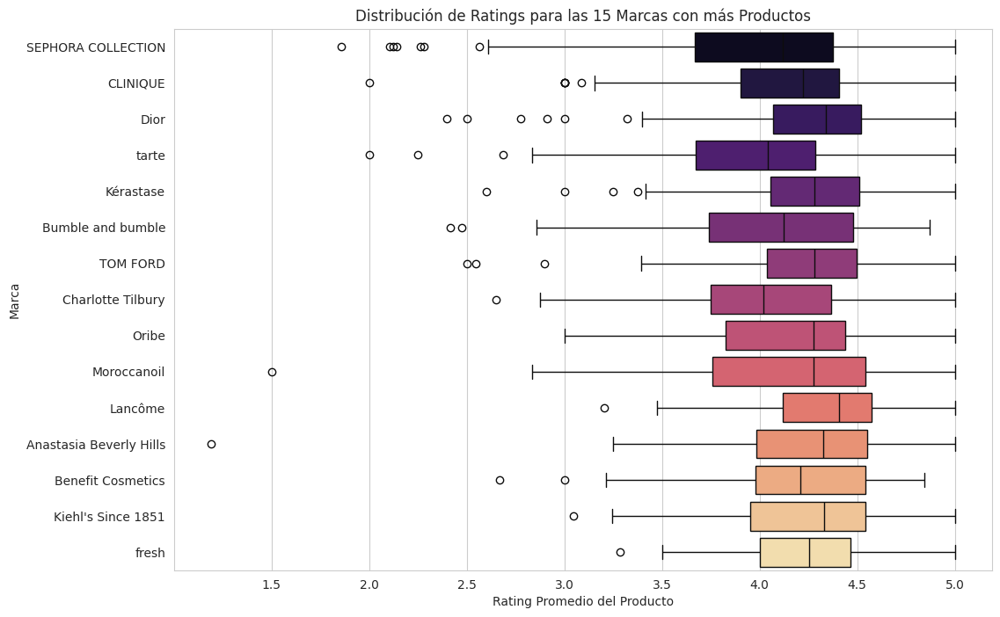

In [ ]:
#3 Análisis de las Marcas Top

top_15_brands = products_df_cleaned['brand_name'].value_counts().nlargest(15).index
df_top_brands = products_df_cleaned[products_df_cleaned['brand_name'].isin(top_15_brands)]

plt.figure(figsize=(12, 8))
sns.boxplot(
    data=df_top_brands,
    x='rating',
    y='brand_name',
    order=top_15_brands,
    palette='magma'
)
plt.title('Distribución de Ratings para las 15 Marcas con más Productos')
plt.xlabel('Rating Promedio del Producto')
plt.ylabel('Marca')
plt.show()

#### **Analisis Grafica 3: Distribución de Ratings para las Marcas Top**

El desempeño de las marcas con mayor presencia en el catálogo es notablemente variado. Se puede ver que marcas como SEPHORA COLLECTION presentan una amplia dispersión en las calificaciones de sus productos, lo que sugiere una percepción de calidad inconsistente. En cambio, otras marcas como fresh o Lancome muestran una distribución de ratings mucho más compacta y elevada, indicando un estándar de calidad más uniforme y una sólida reputación.

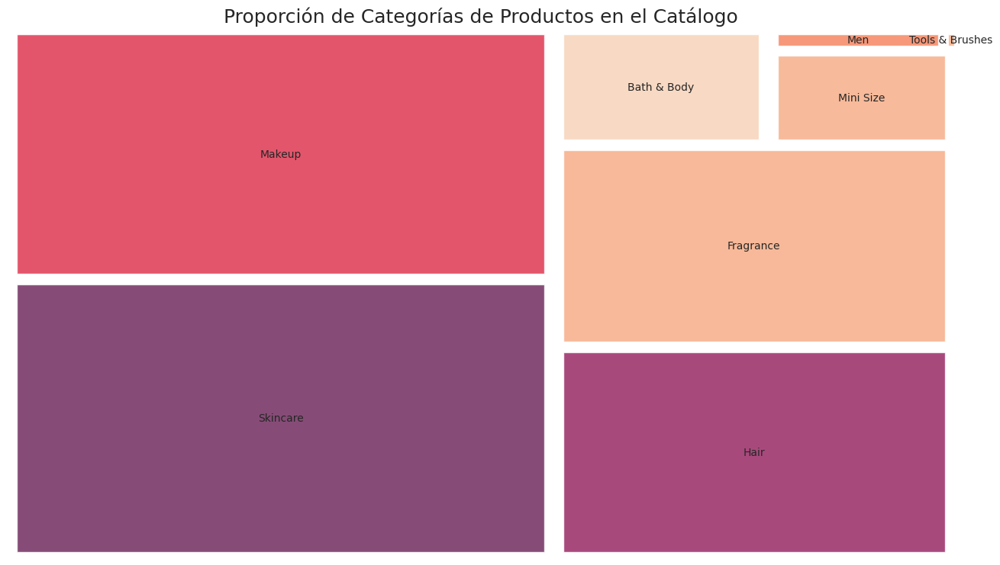

In [ ]:
#4 Treemap de Categorías de Productos

category_counts = products_df_cleaned['primary_category'].value_counts()
plt.figure(figsize=(16, 9))
squarify.plot(sizes=category_counts.values, label=category_counts.index, alpha=0.8, pad=True)
plt.title('Proporción de Categorías de Productos en el Catálogo', fontsize=18)
plt.axis('off')
plt.show()

#### **Analisis Grafica 4: Proporción de Categorías en el Catálogo**
El treemap de categorías ilustra de manera contundente la estructura del inventario de productos. Las categorías de "Skincare" y "Makeup" dominan claramente el catálogo, estableciéndose como las áreas de negocio principales. Otras secciones como "Hair" y "Fragrance" ocupan un lugar secundario pero importante, definiendo así la oferta estratégica y el enfoque comercial de la tienda.

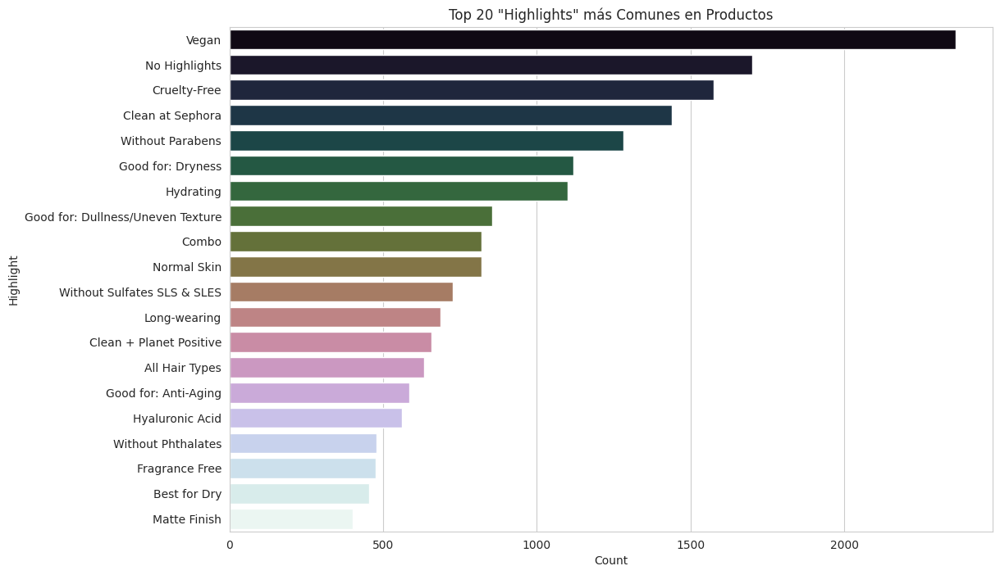

In [ ]:
#5 Análisis de "Highlights" (Etiquetas Destacadas)

highlights_list = products_df_cleaned['highlights'].dropna().tolist()
all_highlights = [re.sub(r"[\[\]']", "", h).strip() for item in highlights_list for h in item.split(",")]
top_20_highlights = Counter(all_highlights).most_common(20)

df_highlights = pd.DataFrame(top_20_highlights, columns=['Highlight', 'Count'])

plt.figure(figsize=(12, 8))
sns.barplot(data=df_highlights, x='Count', y='Highlight', palette='cubehelix')
plt.title('Top 20 "Highlights" más Comunes en Productos')
plt.show()

#### **Analisis Grafica 5: "Highlights" más Comunes en Productos**
Un análisis de los "highlights" más frecuentes revela una fuerte conexión con las tendencias actuales de consumo. Atributos como "Vegan", "Clean at Sephora" y "Cruelty Free" son los más comunes, lo que demuestra un claro enfoque de mercado hacia productos éticos, transparentes y conscientes. Esta información es fundamental para construir recomendaciones basadas en los valores y preferencias de los usuarios.

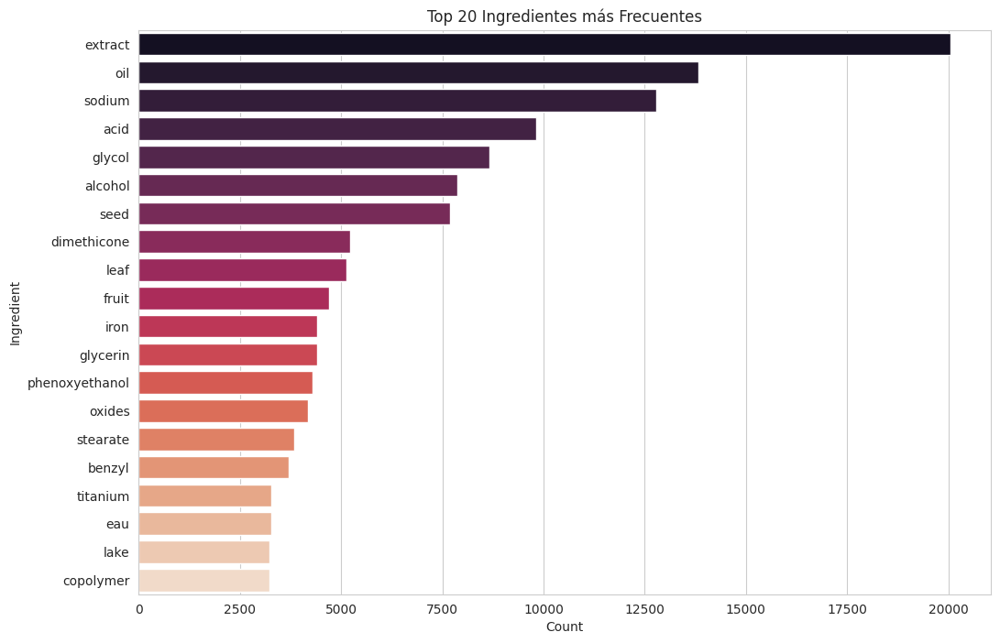

In [ ]:
#6 Ingredientes Más Comunes

all_ingredients = ' '.join(products_df_cleaned['ingredients'].dropna()).lower()
common_words = re.findall(r'\b[a-z]{3,15}\b', all_ingredients)
stopwords = ['the', 'and', 'for', 'with', 'product', 'free', 'contains', 'water', 'aqua', 'parfum', 'fragrance']
filtered_words = [word for word in common_words if word not in stopwords]
top_20_ingredients = Counter(filtered_words).most_common(20)

df_ingredients = pd.DataFrame(top_20_ingredients, columns=['Ingredient', 'Count'])

plt.figure(figsize=(12, 8))
sns.barplot(data=df_ingredients, x='Count', y='Ingredient', palette='rocket')
plt.title('Top 20 Ingredientes más Frecuentes')
plt.show()

#### **Analisis Grafica 6: Ingredientes Más Frecuentes**

El examen de los ingredientes más recurrentes ofrece una visión fundamental sobre la base de la formulación cosmética del catálogo. Componentes clave como extracto, el aceite, el sodio y el alcohol son predominantes. Este conocimiento sobre los ingredientes principales es la piedra angular para desarrollar un sistema de recomendación basado en contenido que pueda identificar productos con perfiles funcionales similares.


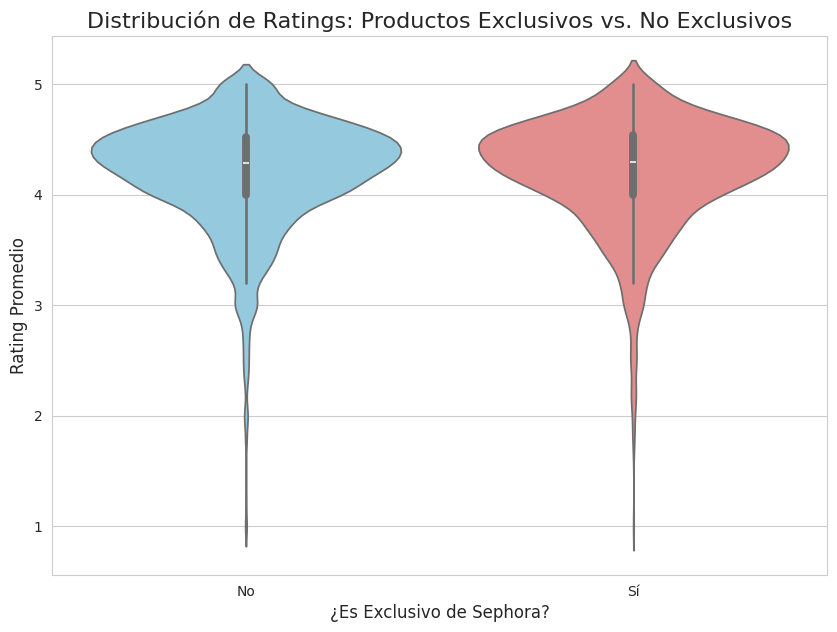

In [ ]:
#7 ¿Son los Productos Exclusivos de Sephora de Mayor Calidad?
plt.figure(figsize=(10, 7))

sns.violinplot(
    data=products_df_cleaned,
    x='sephora_exclusive',
    y='rating',
    palette=['skyblue', 'lightcoral']
)

plt.title('Distribución de Ratings: Productos Exclusivos vs. No Exclusivos', fontsize=16)
plt.ylabel('Rating Promedio', fontsize=12)
plt.xlabel('¿Es Exclusivo de Sephora?', fontsize=12)
plt.xticks(ticks=[0, 1], labels=['No', 'Sí'])
plt.show()

#### **Analisis Grafica 7: Marcas por Rating Promedio de Reseñas**
Este análisis compara la distribución de calificaciones entre los productos exclusivos de Sephora y los que no lo son. Los gráficos de violín para ambas categorías son notablemente similares en su forma, densidad y mediana, lo que indica que no existe una diferencia significativa en la percepción de calidad. Se concluye que la exclusividad de un producto no es un indicador fiable de un rating superior, ya que ambos grupos presentan una fuerte concentración de altas calificaciones. Esta observación sugiere que la exclusividad es una decisión estratégica de marketing más que un sello de calidad diferencial.

### **Reviews Info**


In [ ]:
#Análisis Automatizado con ydata-profiling

reviews_sample = reviews_df_cleaned.sample(n=100000, random_state=42)
print(f"Se ha creado una muestra de {len(reviews_sample)} filas para el perfilamiento.")

profile_reviews_sample = ProfileReport(
    reviews_sample,
    title="Perfilamiento de las Reseñas de Usuarios (Muestra de 100k)"
)
display(profile_reviews_sample)

profile_reviews_sample.to_file("reporte_reseñas.html")
print("Reporte de perfilamiento de reseñas guardado en 'reporte_reseñas.html'")

Se ha creado una muestra de 100000 filas para el perfilamiento.


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 19/19 [00:17<00:00,  1.08it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Reporte de perfilamiento de reseñas guardado en 'reporte_reseñas.html'


#### **Analisis Reporte ydata**
De manera similar, el análisis del conjunto de datos de reseñas reveló patrones de comportamiento importantes sobre los usuarios:

* Se identificó que el perfil de usuario predominante que deja reseñas corresponde a personas con piel mixta (combination) y grasa (oily). Este es un insight fundamental que permite evidenciar relacion entre el tipo de persona con la reseña y priorizar las recomendaciones futuras.

* Se observó un desbalance significativo en la variable objetivo is_recommended, donde un alto porcentaje de las reseñas son positivas. Este hecho es una consideración técnica crítica para el posterior entrenamiento de modelos de clasificación.

* El dashboard evidenció que, aunque la limpieza de datos fue exitosa, variables como review_text poseen una alta cardinalidad inherente, validando la necesidad de aplicar técnicas de Procesamiento de Lenguaje Natural (NLP) para su tratamiento.

In [ ]:
#Análisis de Relación entre Variables


# --- 1. Categórica × Categórica: Tipo de Piel × Recomendación ---
ct_skin_recommend = pd.crosstab(reviews_df_cleaned['skin_type'], reviews_df_cleaned['is_recommended'], normalize="index")
print(" 1. Categórica × Categórica: Proporción de Recomendación para cada Tipo de Piel (%) ")
display((ct_skin_recommend * 100).round(2))


# --- 2. Categórica × Numérica: Tipo de Piel × Calificación ---
skin_rating_stats = reviews_df_cleaned.groupby("skin_type")["rating"].agg(['mean', 'std', 'count'])
print("\n 2. Categórica × Numérica: Estadísticas de Calificación por Tipo de Piel ")
display(skin_rating_stats.sort_values(by="mean", ascending=False).round(2))


# --- 3. Numérica × Numérica: Calificación × "Helpfulness" (Utilidad de la reseña) ---
rating_helpfulness_corr = reviews_df_cleaned[['rating', 'helpfulness']].corr()
print("\n3. Numérica × Numérica: Correlación entre Calificación y Utilidad de la Reseña ")
rating_helpfulness_corr.round(2)

 1. Categórica × Categórica: Proporción de Recomendación para cada Tipo de Piel (%) 


is_recommended,0.0,1.0
skin_type,,
combination,15.51,84.49
dry,16.38,83.62
normal,16.57,83.43
oily,16.61,83.39



 2. Categórica × Numérica: Estadísticas de Calificación por Tipo de Piel 


,mean,std,count
skin_type,,,
combination,4.30,1.14,499544
dry,4.28,1.16,173507
normal,4.28,1.17,121722
oily,4.26,1.18,109204



3. Numérica × Numérica: Correlación entre Calificación y Utilidad de la Reseña 


,rating,helpfulness
rating,1.00,-0.12
helpfulness,-0.12,1.00


#### **Análisis de Relación entre Variables**

Interpretación de los Resultados
1. **`Proporción de Recomendación para cada Tipo de Piel`**
Se eligieron estas variables para descubrir si la satisfacción del cliente varía entre los diferentes segmentos de tipo de piel. El análisis revela que la proporción de recomendaciones es notablemente consistente en todos los grupos principales. Con porcentajes de recomendación que oscilan entre el 83 y el 85 por ciento, se concluye que no hay un tipo de piel que sea significativamente más propenso a recomendar productos que otro, lo que sugiere un nivel de satisfacción general muy similar en el mercado.

2. **`Estadísticas de Calificación por Tipo de Piel`**
Decidimos comparar el tipo de piel con la calificación para detectar si existen diferencias en el rigor con el que cada segmento evalúa los productos. Los resultados son muy interesantes, ya que las calificaciones promedio son extremadamente similares entre todos los tipos de piel, con medias alrededor de 4.2 y 4.3. Esto indica que no hay un tipo de piel que sea inherentemente más crítico o más generoso que otro al momento de calificar. La satisfacción parece depender del producto correcto para su necesidad, no de una predisposición del segmento.

3. **`Correlación entre Calificación y Utilidad de la Reseña`**
Escogimos este par de variables para entender qué tipo de reseñas valora más la comunidad de usuarios. La correlación entre la calificación otorgada y la utilidad de la reseña es de -0.12, lo que representa una correlación negativa débil. Este resultado sugiere que existe una ligera tendencia a que las reseñas con calificaciones más bajas sean percibidas como un poco más útiles por otros usuarios. Esto podría deberse a que las advertencias sobre malas experiencias son consideradas de gran valor para evitar una mala compra.









Analisis:

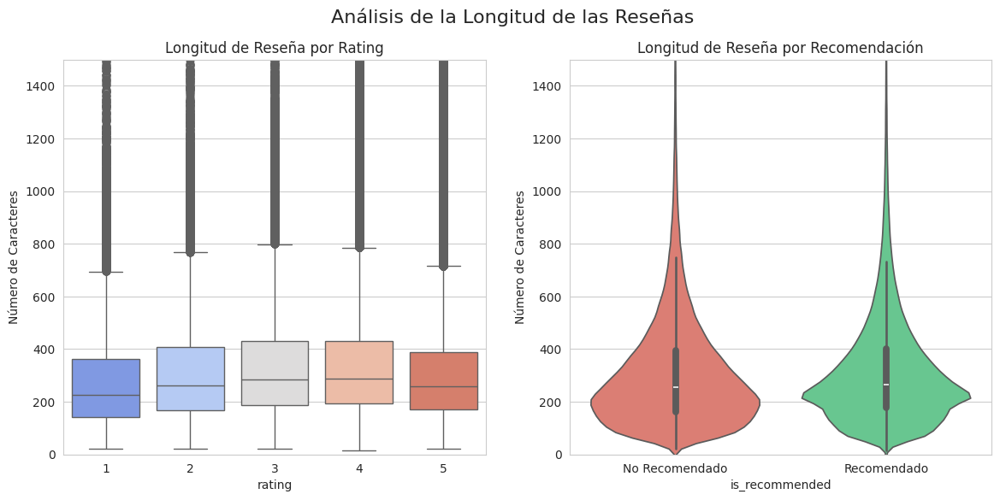

In [ ]:
#1 Longitud de la Reseña vs. Satisfacción

reviews_df_cleaned['review_length'] = reviews_df_cleaned['review_text'].str.len()

plt.figure(figsize=(14, 6))
plt.suptitle("Análisis de la Longitud de las Reseñas", fontsize=16)

plt.subplot(1, 2, 1)
sns.boxplot(data=reviews_df_cleaned, x='rating', y='review_length', palette='coolwarm')
plt.title('Longitud de Reseña por Rating')
plt.ylim(0, 1500) # Cortamos el eje y para mejor visualización
plt.ylabel('Número de Caracteres')

plt.subplot(1, 2, 2)
sns.violinplot(data=reviews_df_cleaned, x='is_recommended', y='review_length', palette=['#EC7063', '#58D68D'])
plt.title('Longitud de Reseña por Recomendación')
plt.ylim(0, 1500)
plt.ylabel('Número de Caracteres')
plt.xticks([0, 1], ['No Recomendado', 'Recomendado'])

plt.show()

#### **Analisis Graficas 1: Análisis de la Longitud de las Reseñas**

El gráfico de la longitud del texto descarta una conexión directa entre la satisfacción del usuario y el nivel de detalle en su retroalimentación. Se observa que los usuarios tienden a escribir reseñas de similar duración, independientemente del rating o si es o no recomendado.

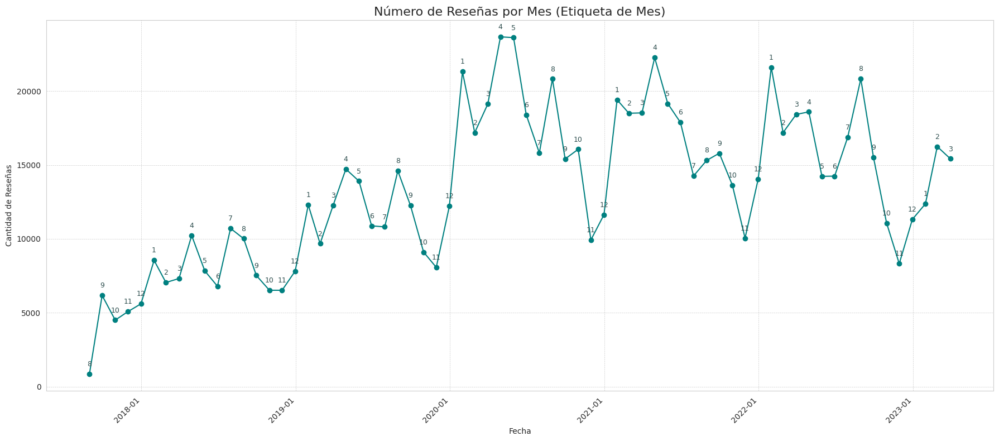

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

reviews_df_cleaned['submission_time'] = pd.to_datetime(reviews_df_cleaned['submission_time'])
reviews_per_month = reviews_df_cleaned.set_index('submission_time').resample('M').size()

fig, ax = plt.subplots(figsize=(18, 8))
ax.plot(reviews_per_month.index, reviews_per_month.values, color='teal', marker='o', linestyle='-')

for date, count in reviews_per_month.items():
    ax.annotate(
        text=f'{date.month}',
        xy=(date, count),
        xytext=(0, 10),
        textcoords="offset points",
        ha='center',
        fontsize=9,
        color='darkslategrey'
    )

date_format = mdates.DateFormatter('%Y-%m')
ax.xaxis.set_major_formatter(date_format)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_title('Número de Reseñas por Mes (Etiqueta de Mes)', fontsize=16)
ax.set_ylabel('Cantidad de Reseñas')
ax.set_xlabel('Fecha')
ax.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
plt.show()

#### **Analisis Grafica 2: Analisis temporal de las reseñas**

La visualización de la actividad de reseñas a lo largo del tiempo muestra una tendencia ascendente clara y sostenida en la participación de los usuarios desde 2018 hasta 2023. Este crecimiento constante indica un nivel de compromiso cada vez mayor dentro de la comunidad de Sephora. Esto sugiere que el contenido generado por los usuarios se está convirtiendo en un recurso cada vez más valioso y abundante para comprender las preferencias del consumidor y el rendimiento de los productos.

Asímismo se evidencian que los meses 4 y 5 han sido picos desde el 2018 hasta 2022, lo que permite evaluar la situación para Sephora como oportunidad de hacer foco a los lotes expuestos para esos meses.

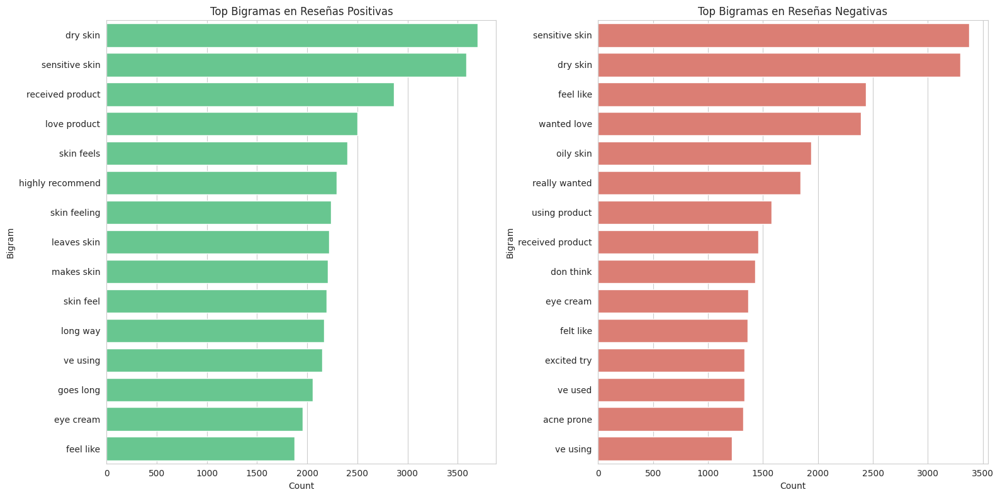

In [ ]:
#3 N-Grams en Reseñas Positivas vs. Negativas

from sklearn.feature_extraction.text import CountVectorizer

def get_top_ngrams(corpus, n=None, ngram_range=(2,2)):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

positive_reviews = reviews_df_cleaned[reviews_df_cleaned['is_recommended']==1]['review_text'].dropna()
negative_reviews = reviews_df_cleaned[reviews_df_cleaned['is_recommended']==0]['review_text'].dropna()

top_pos_bigrams = get_top_ngrams(positive_reviews.sample(50000), n=15)
top_neg_bigrams = get_top_ngrams(negative_reviews.sample(50000), n=15)

df_pos = pd.DataFrame(top_pos_bigrams, columns=['Bigram', 'Count'])
df_neg = pd.DataFrame(top_neg_bigrams, columns=['Bigram', 'Count'])

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
sns.barplot(data=df_pos, x='Count', y='Bigram', color='#58D68D')
plt.title('Top Bigramas en Reseñas Positivas')

plt.subplot(1, 2, 2)
sns.barplot(data=df_neg, x='Count', y='Bigram', color='#EC7063')
plt.title('Top Bigramas en Reseñas Negativas')

plt.tight_layout()
plt.show()

#### **Analisis Grafica 3: Análisis de Frases Comunes en Reseñas**

Este análisis del lenguaje utilizado por los usuarios ofrece una visión directa de los factores que impulsan la satisfacción y la insatisfacción. En las reseñas positivas, predominan frases como "skin feels" y "highly recommend", lo que asocia el éxito de un producto con la experiencia sensorial y el respaldo explícito. Por el contrario, las reseñas negativas presentan algunos terminos como "acnepronet", que identifican claramente los principales puntos de fallo de un producto.